In [55]:
import numpy as np
from matplotlib import pyplot as plt
import cv2

In [56]:
img = plt.imread('ruet_orginal_image.jpg')

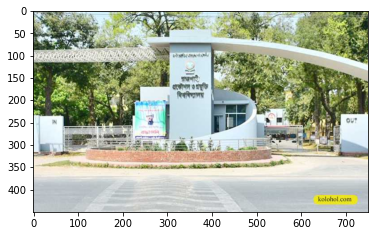

In [57]:
plt.imshow(img)

In [58]:
imb3 = img[:,:,1]

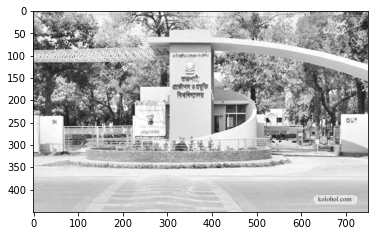

In [59]:
plt.imshow(imb3,cmap='gray')

In [60]:
imb3.shape

(450, 750)

In [61]:
m,n = imb3.shape

In [62]:
def convolution(img,mask,k):
    p = int((k-1)/2) 
    img_pad=np.pad(img, ((p,p),(p,p)), 'constant')
    m,n = img_pad.shape
    img_covule = np.zeros([m,n])

    for i in range(1, m-1):
        for j in range(1, n-1):
            temp = ((img_pad[i-1, j-1]*mask[0, 0])+(img_pad[i-1, j]*mask[0, 1])+(img_pad[i-1, j + 1]*mask[0, 2])+(img_pad[i, j-1]*mask[1, 0])+(img_pad[i, j]*mask[1, 1])+(img_pad[i, j + 1]*mask[1, 2])+(img_pad[i+1,j-1]*mask[2, 0])+(img_pad[i + 1, j]*mask[2, 1])+(img_pad[i + 1, j + 1]*mask[2, 2]))
            img_covule[i,j] = temp
    return img_covule

In [63]:
def convolution_merge(img,mask,mask1,k):
    p = int((k-1)/2) 
    img_pad=np.pad(img, ((p,p),(p,p)), 'constant')
    m,n = img_pad.shape
    img_covule = np.zeros([m,n])

    for i in range(1, m-1):
        for j in range(1, n-1):
            vertical_score = ((img_pad[i-1, j-1]*mask[0, 0])+(img_pad[i-1, j]*mask[0, 1])+(img_pad[i-1, j + 1]*mask[0, 2])+(img_pad[i, j-1]*mask[1, 0])+(img_pad[i, j]*mask[1, 1])+(img_pad[i, j + 1]*mask[1, 2])+(img_pad[i+1,j-1]*mask[2, 0])+(img_pad[i + 1, j]*mask[2, 1])+(img_pad[i + 1, j + 1]*mask[2, 2]))
            
            horizontal_score = ((img_pad[i-1, j-1]*mask1[0, 0])+(img_pad[i-1, j]*mask1[0, 1])+(img_pad[i-1, j + 1]*mask1[0, 2])+(img_pad[i, j-1]*mask1[1, 0])+(img_pad[i, j]*mask1[1, 1])+(img_pad[i, j + 1]*mask1[1, 2])+(img_pad[i+1,j-1]*mask1[2, 0])+(img_pad[i + 1, j]*mask1[2, 1])+(img_pad[i + 1, j + 1]*mask1[2, 2]))

            edge_score = (vertical_score**2 + horizontal_score**2)**.5

            img_covule[i,j] = edge_score
    return img_covule

# Prewitt Operator

In [64]:
vertical_filter = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])

In [65]:
prewitt_vertical_img = convolution(imb3,vertical_filter,3)

Text(0.5, 1.0, 'prewitt vertical operator')

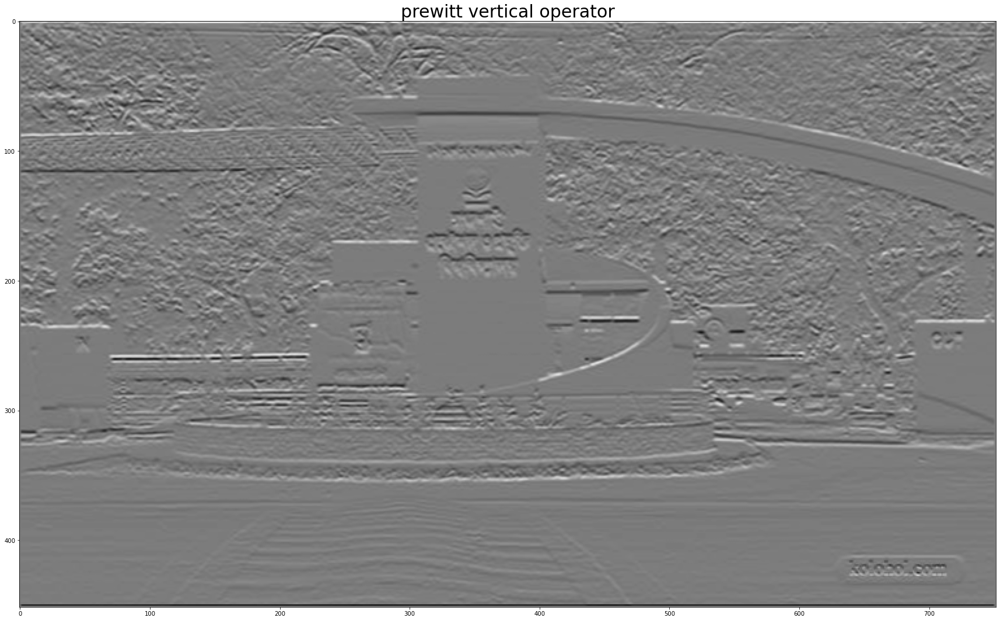

In [66]:

fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(1,1,1)
plt.imshow(prewitt_vertical_img,cmap='gray')
plt.title('prewitt vertical operator',fontsize=30)

In [67]:
horizontal_filter = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

In [68]:
prewitt_horizontal_img = convolution(imb3,horizontal_filter,3)

Text(0.5, 1.0, 'prewitt horizontal operator')

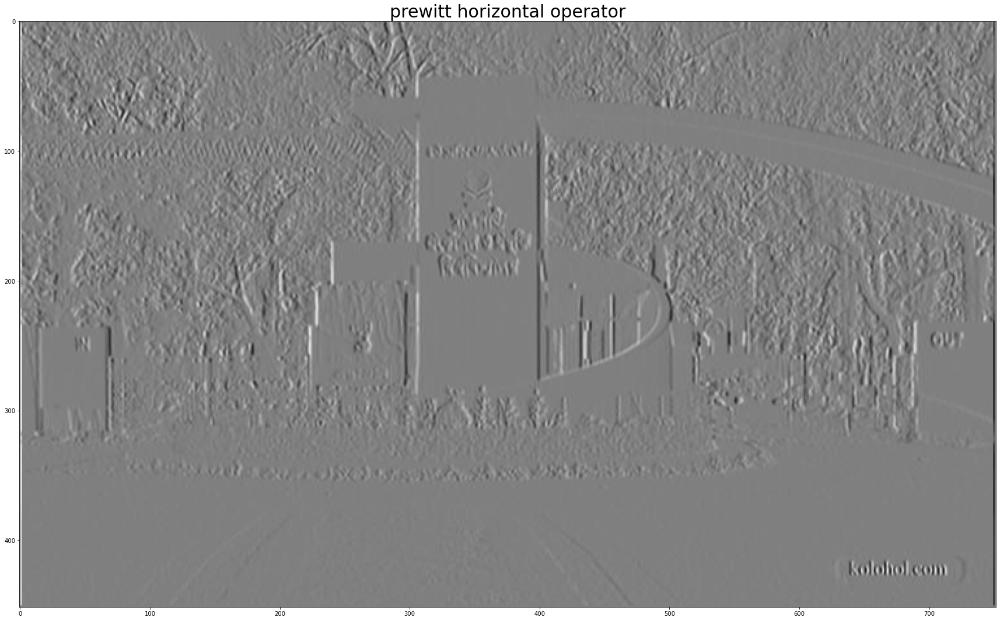

In [69]:
fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(1,1,1)
plt.imshow(prewitt_horizontal_img,cmap='gray')
plt.title('prewitt horizontal operator',fontsize=30)

In [70]:
prewitt_img = convolution_merge(imb3,vertical_filter,horizontal_filter,3)

Text(0.5, 1.0, 'prewitt Image')

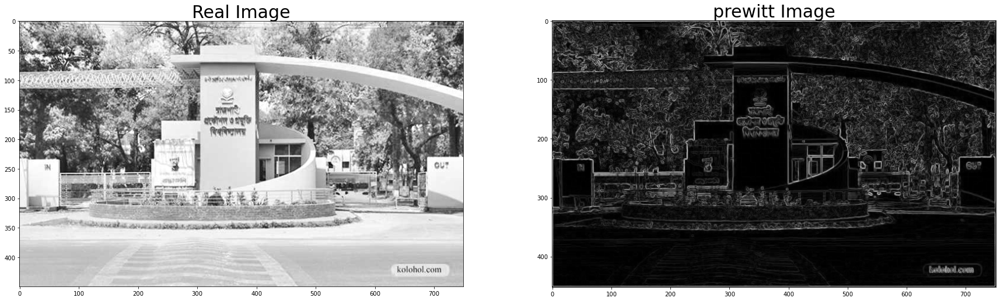

In [71]:
fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(1,2,1)
plt.imshow(imb3,cmap='gray')
plt.title('Real Image',fontsize=30)

a=fig.add_subplot(1,2,2)
plt.imshow(prewitt_img,cmap='gray')
plt.title('prewitt Image',fontsize=30)

# sobel operator

In [72]:
vertical_filter1 = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])

In [73]:
horizontal_filter1 = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])

In [74]:
sobel_img = convolution_merge(imb3,vertical_filter1,horizontal_filter1,3)

Text(0.5, 1.0, 'sobel Image')

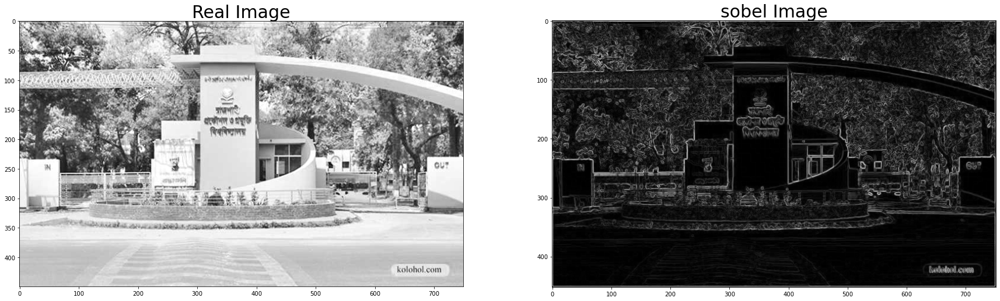

In [75]:
fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(1,2,1)
plt.imshow(imb3,cmap='gray')
plt.title('Real Image',fontsize=30)

a=fig.add_subplot(1,2,2)
plt.imshow(sobel_img,cmap='gray')
plt.title('sobel Image',fontsize=30)

Text(0.5, 1.0, 'sobel Image')

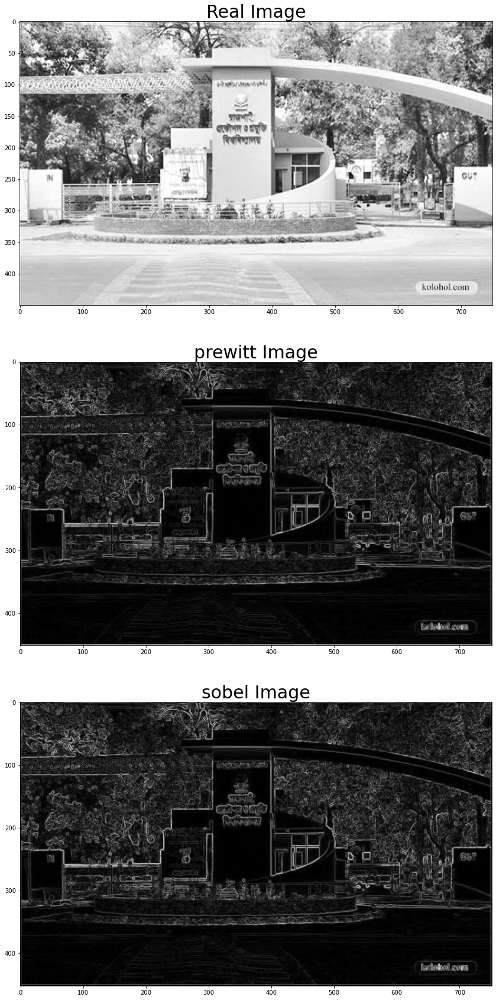

In [76]:
fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(3,1,1)
plt.imshow(imb3,cmap='gray')
plt.title("Real Image", fontsize=30)

a=fig.add_subplot(3,1,2)
plt.imshow(prewitt_img,cmap='gray')
plt.title('prewitt Image',fontsize=30)

a=fig.add_subplot(3,1,3)
plt.imshow(sobel_img,cmap='gray',)
plt.title('sobel Image',fontsize=30)
